[← Back to Index](https://makeabilitylab.github.io/physcomp/signals)

# Overview
In this Notebook, you will write a shape-based gesture classifier (or sometimes called a template-based classifier)—that is, a classifier that measures the similarity between time-series signals. This is in contrast to a feature-based classifier, which extracts features from the signal (*e.g.,* mean, variance, strongest frequency) to train a model for classification. We'll do that in a future notebook.

Importantly, for this assignment, you will be working with **pre-segmented** data—that is, we'll use the segmentation boundaries from the "ground truth" data collected with the GestureRecorder. This will enable us to focus purely on the classification aspects of this assignment rather than intermixing segmentation + classification.

## GestureRecorder data collection
![GestureRecorder animated gif showing a sample data collection](https://raw.githubusercontent.com/makeabilitylab/physcomp/master/signals/assets/movies/GestureRecorder_Trim_800_5fps_compressed90.gif)

We wrote a gesture data collection system composed of two parts ([source code](https://github.com/makeabilitylab/arduino/tree/master/Processing/GestureRecorder)):
1. An **Arduino program** called [LIS3DHGestureRecorder.ino](https://github.com/makeabilitylab/arduino/blob/master/Processing/GestureRecorder/Arduino/LIS3DHGestureRecorder/LIS3DHGestureRecorder.ino) that writes out accelerometer data in a CSV format on Serial: timestamp, x, y, z at ~90 Hz. The program also sends a button state to trigger data recording in the GestureRecorder program, described next.
2. A **Processing program** called [GestureRecorder.pde](https://github.com/makeabilitylab/arduino/blob/master/Processing/GestureRecorder/GestureRecorder.pde), which runs on your Windows, Mac, or Linux machine, reads the Serial data from the Arduino program, and steps you through the gesture data collection process, including: (1) prompting you to perform gestures; (2) saving those gestures to the filesystem (in a directory called `GestureLogs`). You must download and install [Processing](https://processing.org/download/) for this program to work.

Here's a video demonstration of me using GestureRecorder:

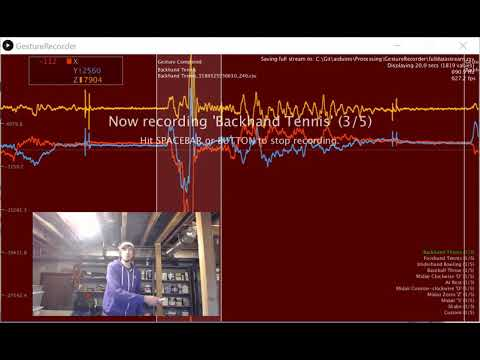

In [1]:
from IPython.lib.display import YouTubeVideo
YouTubeVideo('z9OeVyGdbVY', width=800, height=500)

## Using this notebook

The cells are written such that they should be executed in order.

### Data from GestureRecorder

This Notebook reads gesture logs from the `GestureLogs` folder, which must exist in the same dir as this `.ipynb`. Inside of `GestureLogs`, you should have one or more sub-directories like `JonGestures` or `FrankGestures`, which were created by the `GestureRecorder.pde.` 

We have included one GestureLog folder already called `JonGestures`. In addition, we have a sample of log files from previous classes in the folder [`ADXL335GestureLogs`](https://github.com/makeabilitylab/signals/tree/master/Projects/GestureRecognizer/ADXL335GestureLogs); however, these were recorded with the [ADXL335 accelerometer](https://www.adafruit.com/product/163) rather than the [LIS3DH accelerometer](https://www.adafruit.com/product/2809). So, normalized versions of the gesture signals should be similar but non-normalized versions will have different y-amplitudes. 

### The gesturerec package

We wrote the `gesturerec` package to handle parsing the sensor stream data and to help run basic classification experiments. You can and should look over the code in the [gesturerec](https://github.com/makeabilitylab/signals/tree/master/Projects/GestureRecognizer/gesturerec) folder, particularly `data.py` and `experiments.py`. Feel free to edit this code!

It might look a bit complicated at first but you'll build up a stronger understanding as you look over this Notebook and start writing analysis and visualization code.

There are three primary data structure objects in `gesturerec.data`:
1. At the top level, we have a `GestureSet`, which contains all of the gesture data for a person.
2. Each `GestureSet` object contains a `dict()` mapping gesture names to trials (recall that in the assignment, you had to collect 5 trials of 11 gestures)
3. Each `Trial` object contains the sensor data (`SensorData`) for that trial, which is the accelerometer data (x, y, z, and a computed magnitude)

Given that there can be multiple loaded gesture sets, we have a global object called `map_gesture_sets` that maps the gesture set name to the `GestureSet` object.

## Your TODOs

In general, your coding TODOs are marked below with the word `TODO`. Search for the word "TODO" using your web browser's find functionality (`ctrl-f` or `cmd-f`).

1. Record your own gesture set using [GestureRecorder](https://github.com/makeabilitylab/arduino/tree/master/Processing/GestureRecorder). Name your gesture log folder and put it in `GestureLogs`
2. Then **visualize and explore** the data
3. Think about, experiment, and write code for **preprocessing** the data.
4. Think about, experiment, and write code for **comparing two signals** and returning a **similarity score** (lower is better)
5. Write a k-folds cross-validation method
6. Run experiments and iterate on your algorithms (take notes on what you've found)
7. Write-up your results for your gesture set and for others in the course.

You should be able to get above 90% classification accuracies but aim for 100%, of course! :)

## Misc

### How To Navigate This Notebook
I strongly encourage you to install the [toc2 extension](https://jupyter-contrib-nbextensions.readthedocs.io/en/latest/install.html), which will give you a navigable table of contents (based on markdown) on a side pane and drop-down menu.

### Writing Docstrings
To help with commenting your functions, it's helpful to write [Docstrings](https://www.python.org/dev/peps/pep-0257/). More [here](https://www.datacamp.com/community/tutorials/docstrings-python).

### Dynamic Time Warping Library
If you choose to explore Dynamic Time Warping (DTW), I recommend fastdtw. You can install this by typing the following in cell:
```
import sys
!{sys.executable} -m pip install fastdtw
```
You could also write your own DTW algorithm from scratch (*e.g.,* [link](https://musicinformationretrieval.com/dtw.html)).

## Acknowledgments

This Notebook was designed and written by Professor Jon E. Froehlich at the University of Washington along with feedback from students. It is made available freely online as an [open educational resource](https://en.wikipedia.org/wiki/Open_educational_resources) at the teaching website: https://makeabilitylab.github.io/physcomp/. 

The [website](https://github.com/makeabilitylab/physcomp), [Notebook code](https://github.com/makeabilitylab/signals), and [Arduino code](https://github.com/makeabilitylab/arduino) are all open source using the MIT license.

Please file a GitHub Issue or Pull Request for changes/comments or email me directly.

# Imports

In [2]:
# This cell includes the major classes used in our classification analyses
import matplotlib.pyplot as plt
import numpy as np 
import scipy as sp
from scipy import signal
import random
import os
import math

# We wrote this gesturerec package for the class
# It provides some useful data structures for the accelerometer signal
# and running experiments so you can focus on writing classification code, 
# evaluating your solutions, and iterating 
import gesturerec.utility as grutils
import gesturerec.data as grdata
import gesturerec.gesturestream as grstream
from gesturerec.data import SensorData
from gesturerec.data import GestureSet
from gesturerec.experiments import Experiments
from gesturerec.experiments import ClassificationResults
from gesturerec.experiments import TrialClassificationResult

# Load the data

In [3]:
# Load the data
root_gesture_log_path = './GestureLogs'

print("Found the following gesture log sub-directories")
print(grutils.get_immediate_subdirectories(root_gesture_log_path))

gesture_log_paths = grutils.get_immediate_subdirectories(root_gesture_log_path)
map_gesture_sets = dict()
selected_gesture_set = None

for gesture_log_path in gesture_log_paths:
    path_to_gesture_log = os.path.join(root_gesture_log_path, gesture_log_path)
    print("Creating a GestureSet object for path '{}'".format(path_to_gesture_log))
    gesture_set = GestureSet(path_to_gesture_log)
    gesture_set.load()
    map_gesture_sets[gesture_set.name] = gesture_set

if selected_gesture_set is None:
    # Since we load multiple gesture sets and often want to just visualize and explore
    # one set, in particular, we set a selected_gesture_set variable here
    # Feel free to change this
    #selected_gesture_set = get_random_gesture_set(map_gesture_sets)
    selected_gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "Jlin")
    if selected_gesture_set is None:
        # if the selected gesture set is still None
        selected_gesture_set = grdata.get_random_gesture_set(map_gesture_sets);

print("The selected gesture set:", selected_gesture_set)



Found the following gesture log sub-directories
['PushkarGestures', 'gballewGestures', 'EvanGearyGestures', 'KyheGestures', 'SruthiGestures', 'WessonGestures', 'RahulGestures', 'JonGestures', 'JlinGestures', 'EmanuelGestures', 'MartyPletcherGestures', 'LoumagGestures', 'EvanGestures', 'RobertsonMGestures']
Creating a GestureSet object for path './GestureLogs/PushkarGestures'
Found 55 csv files in ./GestureLogs/PushkarGestures
Found 11 gestures
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair Clockwise 'O''
Found 5 trials for 'Shake'
Found 5 trials for 'At Rest'
Found 5 trials for 'Midair Zorro 'Z''
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Custom'
Found 5 trials for 'Midair 'S''
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Midair Counter-clockwise 'O''
Found 5 trials for 'Backhand Tennis'
Max trial length across all gesture is 'Midair Clockwise 'O'' Trial 1 with 317 sensor events.
Avg samples/sec across 55 sensor files: 91.3
Avg sample length 

Found 5 trials for 'Midair Zorro 'Z''
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair Clockwise 'O''
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Custom'
Found 5 trials for 'Midair Counter-clockwise 'O''
Found 5 trials for 'Underhand Bowling'
Max trial length across all gesture is 'Midair Zorro 'Z'' Trial 3 with 304 sensor events.
Avg samples/sec across 55 sensor files: 91.5
Avg sample length across 55 sensor files: 2.0s

The selected gesture set: './GestureLogs/JlinGestures' : 11 gestures and 55 total trials


The `map_gesture_sets` is a `dict` object and is our primary data structure: it maps gesture dir names to `GestureSet` objects. There's truly nothing special here. But we realize our data structures do require a learning ramp-up. Let's iterate through the GestureSets.

In [4]:
print(f"We have {len(map_gesture_sets)} gesture sets:")
for gesture_set_name, gesture_set in map_gesture_sets.items():
    print(f" {gesture_set_name} with {len(gesture_set.get_all_trials())} trials")

# Feel free to change the selected_gesture_set. It's just a convenient variable
# to explore one gesture set at a time
print(f"The selected gesture set is: {selected_gesture_set.name}")

We have 14 gesture sets:
 PushkarGestures with 55 trials
 gballewGestures with 55 trials
 EvanGearyGestures with 55 trials
 KyheGestures with 55 trials
 SruthiGestures with 68 trials
 WessonGestures with 55 trials
 RahulGestures with 55 trials
 JonGestures with 55 trials
 JlinGestures with 55 trials
 EmanuelGestures with 55 trials
 MartyPletcherGestures with 56 trials
 LoumagGestures with 55 trials
 EvanGestures with 55 trials
 RobertsonMGestures with 55 trials
The selected gesture set is: JlinGestures


# Preprocess the data

You'll want to write your own preprocessing algorithms in `preprocess_signal`. The preprocessed data is stored in SensorData's `x_p`, `y_p`, `z_p`, and `mag_p` while the raw data is `x`, `y`, `z`, and `mag`.

In [5]:
def preprocess_signal(s):
    '''Preprocesses the signal'''
    
    # TODO: write your preprocessing code here. We'll do something very simple for now,
    # which is just a mean filter of window size 5. But you'll need to do more!
    # For exampling, explore detrending and diff filtering algs (with different window sizes)
    
    # detrend data
    detrended_signal = signal.detrend(s)
    # normalize so average is 0
    mean_subtracted_signal = detrended_signal - np.average(detrended_signal)
        
    sampling_rate = 100 # Hz
    
    # This is the best I could get my cheby1 filter -- it's pretty wonky
#     filter_order = 2
#     low_pass_cutoff_freq = 10;
#     sos = signal.cheby1(filter_order, 1, low_pass_cutoff_freq, 'lowpass', fs=sampling_rate, output='sos')
#     processed_signal_cheby1 = signal.sosfilt(sos, mean_subtracted_signal)
    
#     filter_order = 1
#     low_pass_cutoff_freq = 3;
#     sos = signal.butter(filter_order, low_pass_cutoff_freq, 'lowpass', fs=sampling_rate, output='sos')
#     processed_signal_butter = signal.sosfilt(sos, mean_subtracted_signal)
    
    mean_filter_window_size = 5
    processed_signal_mean = np.convolve(mean_subtracted_signal, 
                                   np.ones((mean_filter_window_size,))/mean_filter_window_size, 
                                   mode='valid')
    
    return processed_signal_mean

def preprocess_trial(trial):
    '''Processess the given trial'''
    trial.accel.x_p = preprocess_signal(trial.accel.x)
    trial.accel.y_p = preprocess_signal(trial.accel.y)
    trial.accel.z_p = preprocess_signal(trial.accel.z)
    trial.accel.mag_p = preprocess_signal(trial.accel.mag)

for gesture_set in map_gesture_sets.values():
    for gesture_name, trials in gesture_set.map_gestures_to_trials.items():
        for trial in trials:
            preprocess_trial(trial)

# Explore the data
We have some example visualizations to help you explore the data (and the result of your preprocessing algorithms) but we expect that you'll want (and need) to write more. Exploring data is fun!

For this, we'll use the `selected_gesture_set` variable, which was set during load. You could change it to something else, however, and rerun these cells. For example:

```
selected_gesture_set = grdata.get_random_gesture_set(map_gesture_sets)
```

or

```
selected_gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "Jon")
```

## Plot a random gesture
Let's start by plotting the `x`, `y`, `z` and `mag` for all the trials of a random gesture for the `selected_gesture_set`

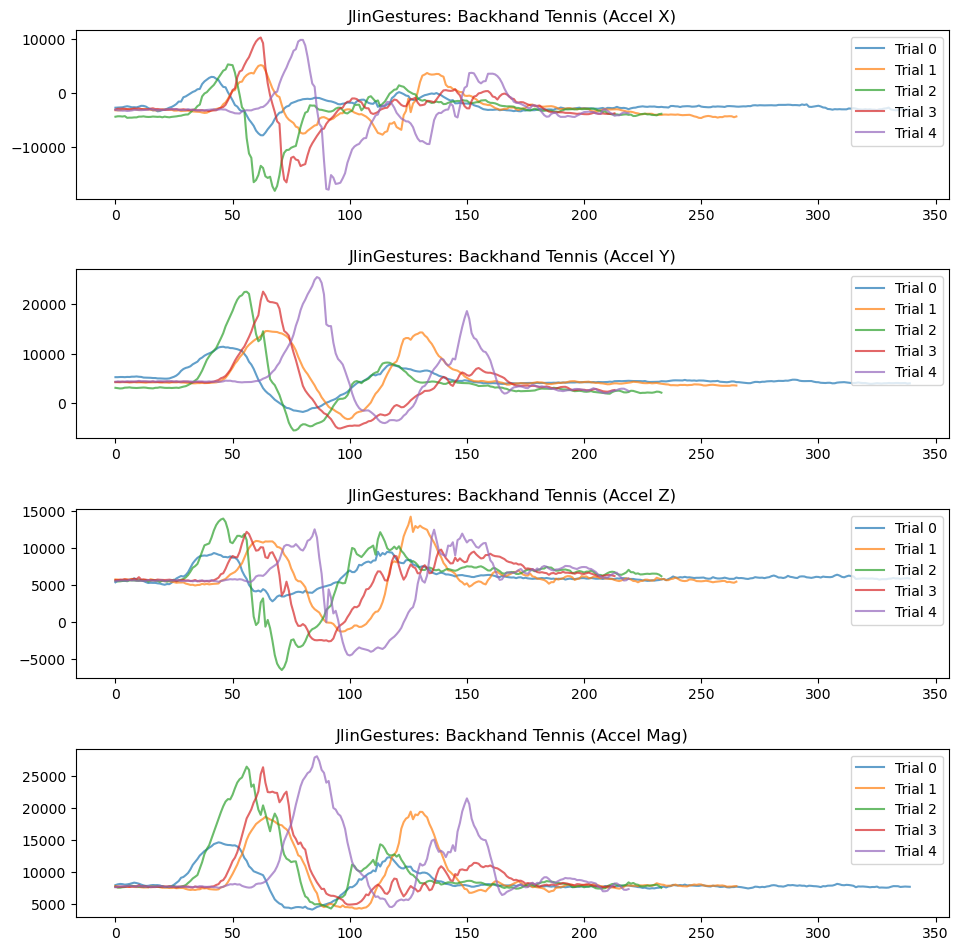

In [6]:
# For example, 
rand_gesture_name = selected_gesture_set.get_random_gesture_name()

# This is where we actually make the plot.
# subplots allows us to make a nice grid of plots. For example, if you want to
# make a 2,2 grid of plots, change the 1 below to 2,2
fig, axes = plt.subplots(4, figsize=(10, 10)) #figsize is width, height
fig.tight_layout(pad=3) # add vertical spacing
gesture_trials = selected_gesture_set.get_trials_for_gesture(rand_gesture_name)
trial_num = 0
for trial in gesture_trials:
    axes[0].plot(trial.accel.x, alpha=0.7, label="Trial {}".format(trial_num))
    axes[1].plot(trial.accel.y, alpha=0.7, label="Trial {}".format(trial_num))
    axes[2].plot(trial.accel.z, alpha=0.7, label="Trial {}".format(trial_num))
    axes[3].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trial_num))
    trial_num = trial_num + 1

# set the title and show the legend
axes[0].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (Accel X)")
axes[0].legend();

axes[1].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (Accel Y)")
axes[1].legend();

axes[2].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (Accel Z)")
axes[2].legend();

axes[3].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (Accel Mag)")
axes[3].legend();

## Plot raw and preprocessed signal

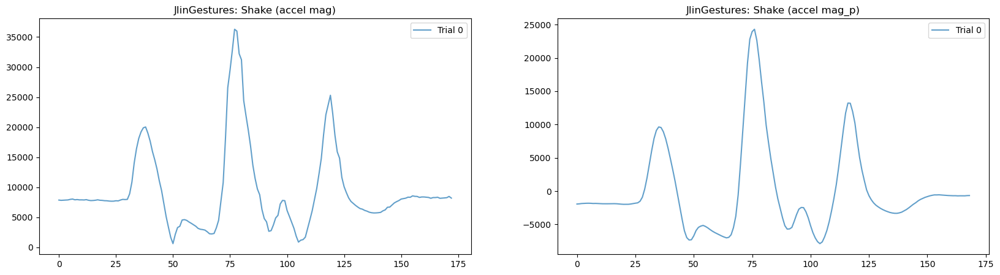

In [7]:
# Now let's plot both the raw and processed signal of a random gesture 
# pulled from a random trial. This helps us explore how our preprocessing
# is working
rand_gesture_name = selected_gesture_set.get_random_gesture_name()

# We'll make a 1x2 grid of plots, so pass 1,2 to subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 5)) #figsize is width, height
rand_trial = selected_gesture_set.get_random_trial_for_gesture(rand_gesture_name)

axes[0].plot(rand_trial.accel.mag, alpha=0.7, label="Trial {}".format(rand_trial.trial_num))
axes[0].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (accel mag)")
axes[0].legend()

axes[1].plot(rand_trial.accel.mag_p, alpha=0.7, label="Trial {}".format(rand_trial.trial_num))
axes[1].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (accel mag_p)")
axes[1].legend(); # include semi-colon to hide return output from legend(), <matplotlib.legend.Legend at 0x263de45dd30>

## Plot giant grid of signals
Now let's go a bit crazy and plot all of the signals in a giant grid. What patterns do you observe? Do the signals look different? Do you think you could write a classifier to differentiate them?

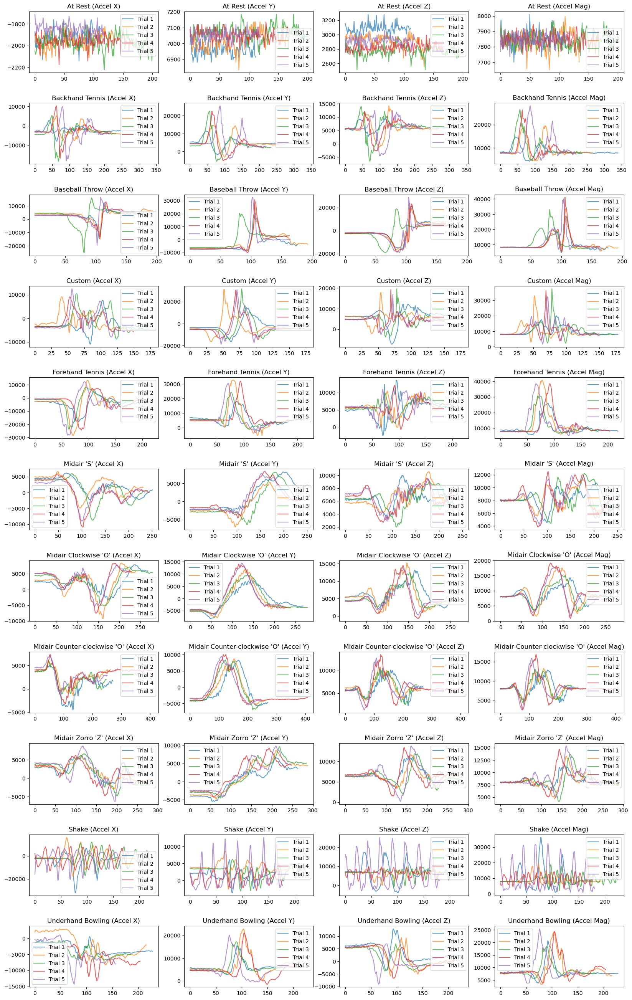

In [8]:
# We are going to make a grid of line graphs with a row for each gesture, so len(mapGestureToTrials) rows
# and a column for each signal type, so 4 columns (one for x, y, z, and mag)
fig, axes = plt.subplots(len(selected_gesture_set.map_gestures_to_trials), 4, 
                         figsize=(20, 3 * len(selected_gesture_set.map_gestures_to_trials)))
fig.subplots_adjust(hspace=0.5)

index = 0
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    gesture_trials = selected_gesture_set.get_trials_for_gesture(gesture_name)
    
    trial_num = 1
    for trial in gesture_trials:
        axes[index][0].plot(trial.accel.x, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][1].plot(trial.accel.y, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][2].plot(trial.accel.z, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][3].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trial_num))
        trial_num = trial_num + 1
        
    axes[index][0].set_title(gesture_name + " (Accel X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gesture_name + " (Accel Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gesture_name + " (Accel Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gesture_name + " (Accel Mag)")
    axes[index][3].legend()
    index = index + 1

Now let's plot all of the accel signals, both raw and processed.

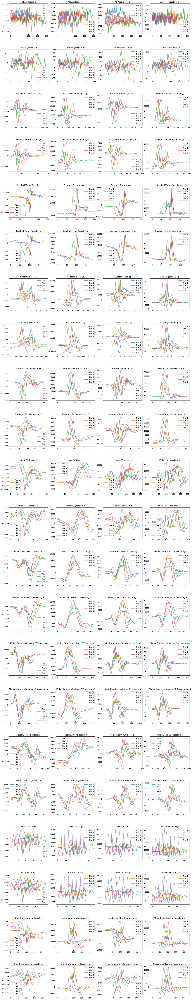

In [9]:
# We are going to make a grid of line graphs with:
# two rows for each gesture (one raw, one processed), so len(mapGestureToTrials) * 2 rows 
# and a column for each signal type, so 4 columns (one for x, y, z, and mag)
fig, axes = plt.subplots(len(selected_gesture_set.map_gestures_to_trials) * 2, 4, 
                         figsize=(20, 5 * 2 * len(selected_gesture_set.map_gestures_to_trials)))
fig.subplots_adjust(hspace=0.5)

index = 0
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    gesture_trials = selected_gesture_set.get_trials_for_gesture(gesture_name)
    
    trial_num = 1
    for trial in gesture_trials:
        axes[index][0].plot(trial.accel.x, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][1].plot(trial.accel.y, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][2].plot(trial.accel.z, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][3].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trial_num))
        
        axes[index + 1][0].plot(trial.accel.x_p, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index + 1][1].plot(trial.accel.y_p, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index + 1][2].plot(trial.accel.z_p, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index + 1][3].plot(trial.accel.mag_p, alpha=0.7, label="Trial {}".format(trial_num))
        
        trial_num = trial_num + 1
        
    axes[index][0].set_title(gesture_name + " (accel x)")
    axes[index][1].set_title(gesture_name + " (accel y)")
    axes[index][2].set_title(gesture_name + " (accel z)")
    axes[index][3].set_title(gesture_name + " (accel mag)")
    
    axes[index][0].legend()
    axes[index][1].legend()
    axes[index][2].legend()
    axes[index][3].legend()
    
    index = index + 1
    axes[index][0].set_title(gesture_name + " (accel x_p)")
    axes[index][1].set_title(gesture_name + " (accel y_p)")
    axes[index][2].set_title(gesture_name + " (accel z_p)")
    axes[index][3].set_title(gesture_name + " (accel mag_p)")
    
    axes[index][0].legend()
    axes[index][1].legend()
    axes[index][2].legend()
    axes[index][3].legend()
    
    index = index + 1

## Plot raw vs. preprocessed magnitude
Or maybe we just want to focus on the magnitude of the signal. Is there enough visual salience in here that you think this signal alone is discriminable for classifying gestures?

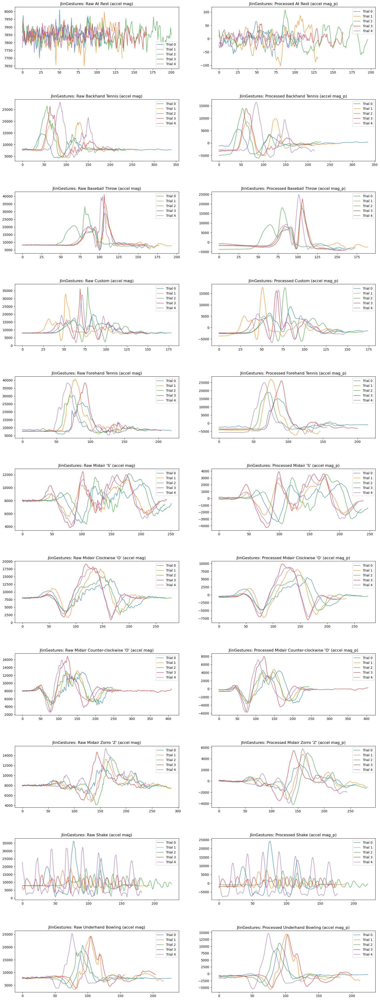

In [10]:
map_gestures_to_trials = selected_gesture_set.map_gestures_to_trials
fig, axes = plt.subplots(len(map_gestures_to_trials), 2, figsize=(20, 5 * len(map_gestures_to_trials)))
fig.subplots_adjust(hspace=0.5)

index = 0
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    gesture_trials = map_gestures_to_trials[gesture_name]
    trial_num = 0
    for trial in gesture_trials:
        axes[index][0].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][1].plot(trial.accel.mag_p, alpha=0.7, label="Trial {}".format(trial_num))
        trial_num = trial_num + 1
        
    axes[index][0].set_title(selected_gesture_set.name + ": Raw " + gesture_name + " (accel mag)")
    axes[index][0].legend()
    
    axes[index][1].set_title(selected_gesture_set.name + ": Processed " + gesture_name + " (accel mag_p)")
    axes[index][1].legend()

    index = index + 1


# Classification experiments

Start analyzing and comparing these gesture signals.Think about:
- What patterns do you see in the data?
- What kind of filtering might be useful?
- How can you best align the signals for comparison? (e.g., hint: scroll down to see the Euclidean distance comparisons)
- What kind of signal transforms might be useful? (e.g., ffts, derivative waveforms)
- What is the simplest way we can compare two signals?


## K-Fold Cross Validation Methods

In [11]:
# The k-fold cross validation methods

# TODO: write your own kfolds method here
def generate_kfolds(num_folds, gesture_set, seed=None):
    '''
    Returns a list of folds where each list item is a dict() with key=gesture name and value=selected trial 
    for that fold. To generate the same fold structure, pass in the same seed value (this is useful for
    setting up experiments)
    
    num_folds : the number of folds
    gesture_set : the gesture set for splitting into k-folds
    seed : an integer seed value (pass in the same seed value to get the same split across multiple executions)
    '''
    
    # Quick check to make sure that there are numFolds of gesture trials for each gesture
    for gesture_name, trials in gesture_set.map_gestures_to_trials.items():
        if num_folds != len(trials):
            raise ValueError("For the purposes of this assignment, the number of folds={} must equal the number of trials for each gesture. Gesture '{}' has {} trials"
                             .format(num_folds, gesture_name, len(trials)))
            
    trials = []
    trial_nums = []
    gesture_names = []
    for gesture_name, gesture_trials in gesture_set.map_gestures_to_trials.items():
        for trial in gesture_trials:
            trials.append(trial)
            trial_nums.append(trial.trial_num)
            gesture_names.append(gesture_name)
            
    numGestures = len(gesture_names) // num_folds
    np.random.seed(seed)
    indices = np.random.randint(5, size=numGestures)
    list_folds = list()
    for fold in range(num_folds):
        cur_fold_map = dict()
        for count, i in enumerate(indices):
            test_trial_i = (fold+i) % num_folds
            test_gesture_start = count*num_folds
            cur_fold_map[gesture_names[test_gesture_start + test_trial_i]] = trials[test_gesture_start + test_trial_i]
        list_folds.append(cur_fold_map)
    
    check_folds(list_folds) # for debugging. You can comment this out
    return list_folds # each index of the list represents a fold, which contains a map of gesture names to trials


from sklearn.model_selection import StratifiedKFold
def generate_kfolds_scikit(num_folds, gesture_set, seed=None):
    '''
    Here's an example of generating kfolds using scikit but returning our data structure
    
    Parameters:
    num_folds: the number of folds
    gesture_set: the gesture set for splitting into k-folds
    seed: an integer seed value (pass in the same seed value to get the same split across multiple executions)
    
    Returns:
    Returns a list of folds where each list item is a dict() with key=gesture name and value=selected trial 
    for that fold. To generate the same fold structure, pass in the same seed value (this is useful for
    setting up experiments). Note that even with the same seed value, this method and generate_kfolds will
    generate different results.
    '''
    
    trials = []
    trial_nums = []
    gesture_names = []
    for gesture_name, gesture_trials in gesture_set.map_gestures_to_trials.items():
        for trial in gesture_trials:
            trials.append(trial)
            trial_nums.append(trial.trial_num)
            gesture_names.append(gesture_name)
    
    skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=seed)
    
    # Iterate through the splits and setup our data structure
    fold_cnt = 0
    list_folds = list()
    for train_idx, test_idx in skf.split(trials, gesture_names):
        cur_fold_map_gesture_to_trial = dict()
        for i in test_idx:
            cur_fold_map_gesture_to_trial[gesture_names[i]] = trials[i]
        list_folds.append(cur_fold_map_gesture_to_trial)    
        fold_cnt += 1
    return list_folds

def print_folds(list_folds):
    '''
    Prints out the folds (useful for debugging)
    '''
    # print out folds (for debugging)
    fold_index = 0
    if fold_index == 0:
        for fold in list_folds:
            print("Fold: ", fold_index)
            for gesture_name, trial in fold.items():
                print("\t{} Trial: {}".format(gesture_name, trial.trial_num))
            fold_index = fold_index + 1
            
def check_folds(folds):
    '''
    Checks to see that the folds are appropriately setup (useful for debugging)
    Throw an exception if there appears to be a problem
    '''
    for test_fold_idx in range(0, len(folds)):
        # check to make sure test data is not in training data
        for test_gesture, test_trial in folds[test_fold_idx].items():
            # search for this test_gesture and trial_num in all other folds
            # it shouldn't be there!
            for train_fold_idx in range(0, len(folds)):
                if test_fold_idx != train_fold_idx:
                    for train_gesture, train_trial in folds[train_fold_idx].items():
                        if test_gesture == train_gesture and test_trial.trial_num == train_trial.trial_num:
                            raise Exception("Uh oh, gesture '{}' trial '{}' was found in both test fold '{}' and\
                                             training fold '{}.' Training folds should not include test data".format(
                                            test_gesture, test_trial.trial_num, test_fold_idx, train_fold_idx))



## The matching algorithms

We have a top-level function called `run_match_algorithm`, which takes in a list of folds (setup for k-fold cross validation) and a "pointer" to a `find_closest_match_alg` algorithm, which may take one or more arguments (from `**kwargs`)

In [12]:
from scipy.spatial import distance
import time

def run_matching_algorithm(list_folds, find_closest_match_alg, **kwargs):
    '''
    Our primary matching algorithm function that takes in a fold, a matching algorithm, and optional 
    arguments (**kwargs) for that matching alg. Returns a ClassificationResults object
    
    list_folds : the folds generated by generate_kfolds
    find_closest_match_alg : "pointer" to the closest match function you want to test
    kwargs : optional arguments to pass to find_closest_match_alg
    '''
    
    verbose = False
    if 'verbose' in kwargs:
        verbose = kwargs['verbose']
    
    fold_index = 0
    map_gesture_name_to_list_results = dict()
    for fold in list_folds:
        if verbose:
            print("\n**FOLD: {}**".format(fold_index))
            
        correctness_cnt_for_fold = 0
        elapsed_time_for_fold = 0
        for test_gesture_name, test_trial in fold.items():
            template_folds = list_folds[0:fold_index] + list_folds[fold_index + 1:len(list_folds)]
            template_trials = list()
            for fold in template_folds:
                for template_gesture_name, template_trial in fold.items():
                    template_trials.append(template_trial)
            
            start_time = time.time()
            trial_classification_result = find_closest_match_alg(test_trial, template_trials, **kwargs)
            elapsed_time_in_secs = time.time() - start_time
            trial_classification_result.fold_idx = fold_index
            trial_classification_result.elapsed_time = elapsed_time_in_secs
            elapsed_time_for_fold += elapsed_time_in_secs
            
            if trial_classification_result.is_correct:
                correctness_cnt_for_fold += 1
            
            if verbose:
                print(trial_classification_result)
            
            # track overall results across comparisons
            if test_gesture_name not in map_gesture_name_to_list_results:
                map_gesture_name_to_list_results[test_gesture_name] = list()
            map_gesture_name_to_list_results[test_gesture_name].append(trial_classification_result)
            
        # print out overall fold accuracy
        fold_accuracy = (correctness_cnt_for_fold / len(fold)) * 100;
        if verbose:
            print("COMPLETED FOLD: {} IN {:0.3f} SECS WITH ACCURACY {}/{} ({:0.1f}%)".
                  format(fold_index, elapsed_time_for_fold, correctness_cnt_for_fold, len(fold), fold_accuracy))

        fold_index = fold_index + 1
    
    classification_result = ClassificationResults(find_closest_match_alg.__name__, 
                                                  map_gesture_name_to_list_results, **kwargs)
    return classification_result
            

### Write your matching algorithms here

We've created two simple matching functions to help you understand the format for our experimental testbed.

In [13]:
from fastdtw import fastdtw

def find_closest_match_euclid_raw_x(test_trial, template_trials, **kwargs):
    '''
    Example closest match function using euclidean distance and the accelerometer X value
    Note: I'm not saying this is necessarily a *good performing* example but it should run :)
    
    For a more generic version of this method, see find_closest_match_euclid_signal
    
    Example:
    run_matching_algorithm(list_folds, find_closest_match_euclid_raw_x, verbose=True)
    
    Parameters:
    test_trial: the test trial
    template_trials: the template trials
    kwargs: optional arguments for match function
    
    Returns a TrialClassificationResult
    '''
    
    # Tuple list of trial to score
    n_best_list_tuple = list()
    for template_trial in template_trials:
        
        # Euclidean distance requires that both arrays are the same length, so we must pad the shorter one
        test_trial_signal = test_trial.accel.x
        template_trial_signal = template_trial.accel.x
        if len(test_trial_signal) > len(template_trial_signal):
            array_length_diff = len(test_trial_signal) - len(template_trial_signal)
            template_trial_signal = np.pad(template_trial_signal, (0, array_length_diff), 'mean')
        elif len(template_trial_signal) > len(test_trial_signal):
            array_length_diff = len(template_trial_signal) - len(test_trial_signal)
            test_trial_signal = np.pad(test_trial_signal, (0, array_length_diff), 'mean')
        
        # Calculate the Euclidean distance between the two signals
        euclid_distance = distance.euclidean(test_trial_signal, template_trial_signal)

        n_best_list_tuple.append((template_trial, euclid_distance))
    
    trial_classification_result = TrialClassificationResult(test_trial, n_best_list_tuple) 
    
    return trial_classification_result

def find_closest_match_euclid_signal(test_trial, template_trials, **kwargs):
    '''
    Example closest match function using euclidean distance and a specified
    signal from SensorData (e.g., x, y, z, mag, x_p, y_p, z_p, mag_p)
    
    This is exactly the same as find_closest_match_euclid_raw_x but more flexible
    in that you can pass a member variable of SensorData in signal_var_name
    
    Example:
    run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=True, signal_var_name='x')
    run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=True, signal_var_name='y')
    
    Parameters:
    test_trial: the test trial
    template_trials: the template trials
    kwargs: one required argument for match function
        signal_var_name must be specified and is the member variable of SensorData used for 
        the test (e.g., x, y, z, mag, x_p, y_p, z_p, mag_p )
    
    Returns a TrialClassificationResult
    '''
    
    if 'signal_var_name' not in kwargs:
        raise Exception("The 'signal_var_name' kwarg must be specified. For example, \"signal_var_name='x'\"") 
   
    signal_var_name = kwargs['signal_var_name']
    
    # Tuple list of trial to score
    n_best_list_tuple = list()
    for template_trial in template_trials:
        
        # Euclidean distance requires that both arrays are the same length, so we must pad the shorter one
        test_trial_signal = getattr(test_trial.accel, signal_var_name)
        template_trial_signal = getattr(template_trial.accel, signal_var_name)
        if len(test_trial_signal) > len(template_trial_signal):
            array_length_diff = len(test_trial_signal) - len(template_trial_signal)
            template_trial_signal = np.pad(template_trial_signal, (0, array_length_diff), 'mean')
        elif len(template_trial_signal) > len(test_trial_signal):
            array_length_diff = len(template_trial_signal) - len(test_trial_signal)
            test_trial_signal = np.pad(test_trial_signal, (0, array_length_diff), 'mean')
        
        # Calculate the Euclidean distance between the two signals
        euclid_distance = distance.euclidean(test_trial_signal, template_trial_signal)

        n_best_list_tuple.append((template_trial, euclid_distance))
    
    trial_classification_result = TrialClassificationResult(test_trial, n_best_list_tuple) 
    
    return trial_classification_result

# TODO: Write your similarity functions here. Write as many as you can brainstorm! :)

def find_closest_match_shift_euclid(test_trial, template_trials, **kwargs):
    '''
    Example closest match function using correlation shift and comparing with euclidean distance and a specified
    signal from SensorData (e.g., x, y, z, mag, x_p, y_p, z_p, mag_p)
    
    Example:
    run_matching_algorithm(list_folds, find_closest_match_shift_euclid, verbose=True, signal_var_name='x')
    run_matching_algorithm(list_folds, find_closest_match_shift_euclid, verbose=True, signal_var_name='y')
    
    Parameters:
    test_trial: the test trial
    template_trials: the template trials
    kwargs: one required argument for match function
        signal_var_name must be specified and is the member variable of SensorData used for 
        the test (e.g., x, y, z, mag, x_p, y_p, z_p, mag_p )
    
    Returns a TrialClassificationResult
    '''
    
    if 'signal_var_name' not in kwargs:
        raise Exception("The 'signal_var_name' kwarg must be specified. For example, \"signal_var_name='x'\"") 
   
    signal_var_name = kwargs['signal_var_name']
    
    # Tuple list of trial to score
    n_best_list_tuple = list()
    for template_trial in template_trials:
        test_trial_signal = getattr(test_trial.accel, signal_var_name)
        template_trial_signal = getattr(template_trial.accel, signal_var_name)
        # Euclidean distance requires that both arrays are the same length, so we must pad the shorter one
        if len(test_trial_signal) > len(template_trial_signal):
            array_length_diff = len(test_trial_signal) - len(template_trial_signal)
            template_trial_signal = np.pad(template_trial_signal, (0, array_length_diff), 'mean')
        elif len(template_trial_signal) > len(test_trial_signal):
            array_length_diff = len(template_trial_signal) - len(test_trial_signal)
            test_trial_signal = np.pad(test_trial_signal, (0, array_length_diff), 'mean')
        
        correlate_result = signal.correlate(template_trial_signal, test_trial_signal, 'full')
        trial_shift_positions = np.arange(-len(template_trial_signal) + 1, len(test_trial_signal))
        best_correlation_index = np.argmax(correlate_result)
        shift = trial_shift_positions[best_correlation_index]
        
        # Using mean fill on shifted trial data
        fill_val = np.mean(test_trial_signal)
        shifted = np.empty_like(test_trial_signal)
        if shift > 0:
            shifted[:shift] = fill_val
            shifted[shift:] = test_trial_signal[:-shift]
        elif shift < 0:
            shifted[shift:] = fill_val
            shifted[:shift] = test_trial_signal[-shift:]
        else:
            shifted[:] = test_trial_signal
        
        # Calculate the Euclidean distance between the two signals
        euclid_distance = distance.euclidean(shifted, template_trial_signal)

        n_best_list_tuple.append((template_trial, euclid_distance))
    
    trial_classification_result = TrialClassificationResult(test_trial, n_best_list_tuple) 
    
    return trial_classification_result

def find_closest_match_dtw(test_trial, template_trials, **kwargs):
    if 'signal_var_name' not in kwargs:
        raise Exception("The 'signal_var_name' kwarg must be specified. For example, \"signal_var_name='x'\"") 
   
    signal_var_name = kwargs['signal_var_name']
    test_trial_signal = getattr(test_trial.accel, signal_var_name)
    n = len(test_trial_signal)
    
    # Tuple list of trial to score
    n_best_list_tuple = list()
    for template_trial in template_trials:
        template_trial_signal = getattr(template_trial.accel, signal_var_name)
        m = len(template_trial_signal)
        
        DP = [[np.inf for _ in range(m+1)] for _ in range(n+1)]
        for i in range(1, n+1):
            for j in range(1, m+1):
                min_prev = min(DP[i-1][j], DP[i-1][j-1], DP[i][j-1])
                if min_prev == np.inf:
                    min_prev = 0
                DP[i][j] = abs(test_trial_signal[i-1] - template_trial_signal[j-1]) + min_prev
        
        # Retrace path and sum least-neighbor as distance between time series
        dtw_dist = DP[n][m]
        i = n
        j = m
        while i-1>=0 and j-1>=0:
            cur_val = DP[i-1][j]
            cur_i = i-1
            cur_j = j
            if DP[i-1][j-1] < cur_val:
                cur_val = DP[i-1][j-1]
                cur_i = i-1
                cur_j = j-1
            if DP[i][j-1] < cur_val:
                cur_val = DP[i][j-1]
                cur_i = i
                cur_j = j-1
            if cur_val == np.inf:
                break
            dtw_dist += cur_val
            i = cur_i
            j = cur_j
        
        n_best_list_tuple.append((template_trial, dtw_dist))
    
    trial_classification_result = TrialClassificationResult(test_trial, n_best_list_tuple) 
    
    return trial_classification_result

# Broken due to some sort of array dimension issue internal to the fastDTW alg - not sure why
# DTW implemented from scratch above
def fast_dtw(test_trial, template_trials, **kwargs):
    if 'signal_var_name' not in kwargs:
        raise Exception("The 'signal_var_name' kwarg must be specified. For example, \"signal_var_name='x'\"") 
   
    signal_var_name = kwargs['signal_var_name']
    test_trial_signal = getattr(test_trial.accel, signal_var_name)
    
    n_best_list_tuple = list()
    for template_trial in template_trials:
        template_trial_signal = getattr(template_trial.accel, signal_var_name)
        print(type(template_trial_signal))
        print(template_trial_signal.ndim)
        print(type(test_trial_signal))
        print(test_trial_signal.ndim)
        d, path = fastdtw(template_trial_signal, test_trial_signal, dist=distance.euclidean)
        # Not sure why but getting errors with array dim when calling scipy signal distance between 2 points bc expects array: Input vector should be 1-D.
        n_best_list_tuple.append((template_trial, d))
    
    trial_classification_result = TrialClassificationResult(test_trial, n_best_list_tuple) 
    
    return trial_classification_result

## Running Experiments

In [14]:
# Run experiments
# Note: remember, we want you to write your own generate_kfolds function
# You can use generate_kfolds_scikit instead if you'd like to test other parts of your code 
# but you must eventually write your own kfold split code for the assignment
# gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "Easy")
gesture_set = selected_gesture_set

# list_folds = generate_kfolds_scikit(5, gesture_set, seed=5)
list_folds = generate_kfolds(5, gesture_set, seed=5)

# print out folds (for debugging)
print("DEBUG: PRINTING OUT FOLDS")
print_folds(list_folds)

# track multiple experiments
experiments = Experiments()

# # run first experiment 
# results_shift_mag_p = run_matching_algorithm(list_folds, find_closest_match_shift_euclid, verbose=True, signal_var_name='mag_p')
# results_shift_mag_p.title = "{}: Euclidean distance with cross-correlation-shifted processed mag signal".format(gesture_set.name)
# experiments.add(results_shift_mag_p)

# # run second experiment 
# results_shift_mag = run_matching_algorithm(list_folds, find_closest_match_shift_euclid, verbose=True, signal_var_name='mag')
# results_shift_mag.title = "{}: Euclidean distance with cross-correlation-shifted mag signal".format(gesture_set.name)
# experiments.add(results_shift_mag)

# # run third experiment 
# results_shift_y_p = run_matching_algorithm(list_folds, find_closest_match_shift_euclid, verbose=True, signal_var_name='y_p')
# results_shift_y_p.title = "{}: Euclidean distance with cross-correlation-shifted processed y signal".format(gesture_set.name)
# experiments.add(results_shift_y_p)

# # run fourth experiment 
# results_shift_y = run_matching_algorithm(list_folds, find_closest_match_shift_euclid, verbose=True, signal_var_name='y')
# results_shift_y.title = "{}: Euclidean distance with cross-correlation-shifted y signal".format(gesture_set.name)
# experiments.add(results_shift_y)

# run fifth experiment 
results_dtw_y_p = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=True, signal_var_name='y_p')
results_dtw_y_p.title = "{}: DTW distance with processed y signal".format(gesture_set.name)
experiments.add(results_dtw_y_p)

results_dtw_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=True, signal_var_name='mag')
results_dtw_mag.title = "{}: DTW distance with raw mag signal".format(gesture_set.name)
experiments.add(results_dtw_mag)

# run sixth experiment 
results_dtw_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=True, signal_var_name='y')
results_dtw_y.title = "{}: DTW distance with y signal".format(gesture_set.name)
experiments.add(results_dtw_y)

# # Broken: issues with calculating euclidean distance between "points" not vectors
# # run seventh experiment  
# results_fast_dtw_y = run_matching_algorithm(list_folds, fast_dtw, verbose=True, signal_var_name='y')
# results_fast_dtw_y.title = "{}: Fast DTW distance with y signal".format(gesture_set.name)
# experiments.add(results_fast_dtw_y)


DEBUG: PRINTING OUT FOLDS
Fold:  0
	Custom Trial: 3
	Midair Zorro 'Z' Trial: 0
	Forehand Tennis Trial: 1
	Midair Counter-clockwise 'O' Trial: 0
	Midair Clockwise 'O' Trial: 4
	Baseball Throw Trial: 3
	Underhand Bowling Trial: 0
	Shake Trial: 0
	Backhand Tennis Trial: 4
	At Rest Trial: 1
	Midair 'S' Trial: 0
Fold:  1
	Custom Trial: 4
	Midair Zorro 'Z' Trial: 1
	Forehand Tennis Trial: 2
	Midair Counter-clockwise 'O' Trial: 1
	Midair Clockwise 'O' Trial: 0
	Baseball Throw Trial: 4
	Underhand Bowling Trial: 1
	Shake Trial: 1
	Backhand Tennis Trial: 0
	At Rest Trial: 2
	Midair 'S' Trial: 1
Fold:  2
	Custom Trial: 0
	Midair Zorro 'Z' Trial: 2
	Forehand Tennis Trial: 3
	Midair Counter-clockwise 'O' Trial: 2
	Midair Clockwise 'O' Trial: 1
	Baseball Throw Trial: 0
	Underhand Bowling Trial: 2
	Shake Trial: 2
	Backhand Tennis Trial: 1
	At Rest Trial: 3
	Midair 'S' Trial: 2
Fold:  3
	Custom Trial: 1
	Midair Zorro 'Z' Trial: 3
	Forehand Tennis Trial: 4
	Midair Counter-clockwise 'O' Trial: 3
	Midair

Correct : Best match for 'Baseball Throw' Trial 3 is 'Baseball Throw' Trial 4 w/score: 6105913.4 (0.443s)
Correct : Best match for 'Underhand Bowling' Trial 0 is 'Underhand Bowling' Trial 4 w/score: 8330968.3 (0.619s)
Incorrect : Best match for 'Shake' Trial 0 is 'Custom' Trial 4 w/score: 21906090.8 (0.469s)
Correct : Best match for 'Backhand Tennis' Trial 4 is 'Backhand Tennis' Trial 2 w/score: 19981935.8 (0.594s)
Correct : Best match for 'At Rest' Trial 1 is 'At Rest' Trial 0 w/score: 315662.8 (0.365s)
Correct : Best match for 'Midair 'S'' Trial 0 is 'Midair 'S'' Trial 4 w/score: 8907029.6 (0.681s)
COMPLETED FOLD: 0 IN 6.042 SECS WITH ACCURACY 10/11 (90.9%)

**FOLD: 1**
Correct : Best match for 'Custom' Trial 4 is 'Custom' Trial 2 w/score: 10939762.1 (0.398s)
Correct : Best match for 'Midair Zorro 'Z'' Trial 1 is 'Midair Zorro 'Z'' Trial 3 w/score: 7865086.2 (0.758s)
Correct : Best match for 'Forehand Tennis' Trial 2 is 'Forehand Tennis' Trial 3 w/score: 15980536.7 (0.491s)
Correct :

Correct : Best match for 'Midair Zorro 'Z'' Trial 2 is 'Midair Zorro 'Z'' Trial 3 w/score: 9894992.0 (0.755s)
Correct : Best match for 'Forehand Tennis' Trial 3 is 'Forehand Tennis' Trial 4 w/score: 17458288.0 (0.542s)
Correct : Best match for 'Midair Counter-clockwise 'O'' Trial 2 is 'Midair Counter-clockwise 'O'' Trial 0 w/score: 9957024.0 (0.662s)
Correct : Best match for 'Midair Clockwise 'O'' Trial 1 is 'Midair Clockwise 'O'' Trial 4 w/score: 20983024.0 (0.634s)
Correct : Best match for 'Baseball Throw' Trial 0 is 'Baseball Throw' Trial 3 w/score: 11287168.0 (0.471s)
Correct : Best match for 'Underhand Bowling' Trial 2 is 'Underhand Bowling' Trial 0 w/score: 18192208.0 (0.496s)
Correct : Best match for 'Shake' Trial 2 is 'Shake' Trial 1 w/score: 22402672.0 (0.614s)
Correct : Best match for 'Backhand Tennis' Trial 1 is 'Backhand Tennis' Trial 4 w/score: 40743872.0 (0.707s)
Correct : Best match for 'At Rest' Trial 3 is 'At Rest' Trial 4 w/score: 326112.0 (0.443s)
Correct : Best matc

# Visualizing Experiment Results
We've written a number of functions to help visualize experimental results. You'll likely want to add more, for example:
- Visualize incorrect matches. What happened? What could you do to improve your algorithm so these incorrect matches don't occur?

In [15]:
import itertools
from sklearn.metrics import confusion_matrix
from matplotlib.lines import Line2D

def plot_bar_graph_average_scores_by_gesture(classification_results):
    '''
    Plots the average scores for correct and incorrect matches
    A good matching algorithm should have much lower scores for correct
    matches than incorrect matches (if this is not the case, you'll want to work
    on improving your matching algorithm)
    '''
  
    correct_score_means = []
    incorrect_score_means = []
    gesture_names = classification_results.get_gesture_names()
    for gesture_name in gesture_names:
        scores_correct_matches = np.array(classification_results.get_correct_match_scores_for_gesture(gesture_name))
        scores_incorrect_matches = np.array(classification_results.get_incorrect_match_scores_for_gesture(gesture_name))

        if len(scores_correct_matches) > 0:
            correct_score_means.append(np.mean(scores_correct_matches))
        else:
            correct_score_means.append(0)
        
        if len(scores_incorrect_matches) > 0:
            incorrect_score_means.append(np.mean(scores_incorrect_matches))
        else:
            incorrect_score_means.append(0)

    # create plot
    fig, ax = plt.subplots(figsize=(12, 5))
    index = np.arange(len(gesture_names))
    bar_width = 0.35
    opacity = 0.8

    bars_correct = plt.bar(index, correct_score_means, bar_width, alpha=opacity, color='b', label='Correct')
    bars_incorrect = plt.bar(index + bar_width, incorrect_score_means, bar_width, alpha=opacity, color='g', label='Incorrect')

    plt.xlabel('Gesture')
    plt.ylabel('Average Scores')
    plt.title('Average Scores By Gesture and Correctness\n' + classification_results.get_title())
    plt.xticks(index - bar_width, gesture_names, rotation=45)
    plt.legend()

    plt.tight_layout()
    plt.show()
    
def plot_bar_graph_average_nbestlist_location_by_gesture(classification_results):
    '''
    Plots the average n-best list location for each gesture
    '''
    avg_nbestlist_location = []
    gesture_names = classification_results.get_gesture_names()

    for gesture_name in gesture_names:
        correct_match_indices_in_nbestlist = np.array(classification_results.get_correct_match_indices_in_nbestlist_for_gesture(gesture_name))
        avg_nbestlist_location.append(np.mean(correct_match_indices_in_nbestlist))

    # create plot
    fig, ax = plt.subplots(figsize=(12, 5))
    index = np.arange(len(gesture_names))
    # bar_width = 0.35
    opacity = 0.8

    bars_correct = plt.bar(index, avg_nbestlist_location, alpha=opacity, color='b', label='Avg NBest List Location')

    plt.xlabel('Gesture')
    plt.ylabel('Average NBest List Location')
    plt.title('Average NBest List Location By Gesture\n' + classification_results.get_title())
    plt.xticks(index, gesture_names, rotation=45)
    plt.legend()

    plt.tight_layout()
    plt.show()
    
def plot_classification_result_as_confusion_matrix(classification_result, normalize=False, cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    
    Code based on:
      - http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-selection-plot-confusion-matrix-py
    See also
      - https://stackoverflow.com/a/35572520
      - Plotting with matshow: https://matplotlib.org/gallery/images_contours_and_fields/matshow.html#sphx-glr-gallery-images-contours-and-fields-matshow-py
    """
    cm = classification_result.get_confusion_matrix()
    classes = classification_result.get_gesture_names()
    plot_confusion_matrix(cm, classes, classification_result.get_title(), normalize, cmap)
    
def plot_confusion_matrix(cm, classes, title, normalize=False, cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        # print("Normalized confusion matrix")

    # print(cm)
    plt.figure(figsize=(12, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap) #imshow displays data on a 2D raster
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

def plot_bar_graph_overall_performance(experiments):
    '''
    Plots a bar graph of overall performance
    experiments : an Experiments object
    '''
    
    list_experiments = experiments.get_experiments_sorted_by_accuracy();
    n_groups = len(list_experiments)

    experiment_names = [] 
    experiment_accuracies = [] 
    for experiment in list_experiments:
        experiment_names.append(experiment.title)
        experiment_accuracies.append(experiment.get_accuracy())

    # create plot
    fig_height = max(n_groups * 0.5, 5)
    fig, ax = plt.subplots(figsize=(12, fig_height))
    index = np.arange(len(experiment_names))
    # bar_width = 0.35
    opacity = 0.8

    plt.grid(zorder=0)
    bars = plt.barh(index, experiment_accuracies, alpha=opacity, color='b', zorder=3)
    
    for i, v in enumerate(experiment_accuracies):
        ax.text(v + 0.01, i, "{:0.2f}".format(v), color='black', fontweight='bold')
    
    plt.ylabel('Experiment')
    plt.xlabel('Overall Accuracy')
    plt.xlim(0, 1.2)
    plt.title('Overall Accuracy by Experiment')
    plt.yticks(index, experiment_names)

    plt.tight_layout()
    plt.show()
    
def plot_bar_graph_overall_time(experiments):
    '''
    Plots a bar graph of overall computation time per experiment
    experiments : an Experiments object
    '''
    
    list_experiments = experiments.get_experiments_sorted_by_computation_time();
    n_groups = len(list_experiments)

    experiment_names = [] 
    experiment_times = [] 
    for experiment in list_experiments:
        experiment_names.append(experiment.title)
        experiment_times.append(experiment.total_time)

    # create plot
    fig_height = max(n_groups * 0.5, 5)
    fig, ax = plt.subplots(figsize=(12, fig_height))
    index = np.arange(len(experiment_names))
    # bar_width = 0.35
    opacity = 0.8

    plt.grid(zorder=0)
    bars = plt.barh(index, experiment_times, alpha=opacity, color='b', zorder=3)
    
    for i, v in enumerate(experiment_times):
        ax.text(v, i, "{:0.2f}".format(v), color='black', fontweight='bold')
    
    plt.ylabel('Experiment')
    plt.xlabel('Overall Time (secs)')
    plt.xlim(0, list_experiments[-1].total_time * 1.3)
    plt.title('Overall Time (Secs) by Experiment')
    plt.yticks(index, experiment_names)

    plt.tight_layout()
    plt.show()
    
def plot_bar_graph_avg_time_per_comparison(experiments):
    '''
    Plots a bar graph of average computation time per comparison for each experiment
    experiments : an Experiments object
    '''
    
    list_experiments = experiments.get_experiments_sorted_by_avg_time_per_comparison();
    n_groups = len(list_experiments)

    experiment_names = [] 
    experiment_times = [] 
    for experiment in list_experiments:
        experiment_names.append(experiment.title)
        experiment_times.append(experiment.get_avg_time_per_comparison())

    # create plot
    fig_height = max(n_groups * 0.5, 5)
    fig, ax = plt.subplots(figsize=(12, fig_height))
    index = np.arange(len(experiment_names))
    # bar_width = 0.35
    opacity = 0.8

    plt.grid(zorder=0)
    bars = plt.barh(index, experiment_times, alpha=opacity, color='b', zorder=3)
    
    for i, v in enumerate(experiment_times):
        ax.text(v, i, "{:0.4f}".format(v), color='black', fontweight='bold')
    
    plt.ylabel('Experiment')
    plt.xlabel('Average Time per Comparison (secs)')
    plt.xlim(0, list_experiments[-1].get_avg_time_per_comparison() * 1.2)
    plt.title('Average Time per Comparison (Secs) by Experiment')
    plt.yticks(index, experiment_names)

    plt.tight_layout()
    plt.show()
    
def plot_nbestlist_performance(experiments):
    '''
    Plots a line graph of n-best list performance
    experiments : an Experiments object
    '''
    
    list_experiments = experiments.get_experiments_sorted_by_accuracy();
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    marker = itertools.cycle(('.','o','v','^','<','>','8',
                              's','p','P','*','h','H','+','x','X','D','d','|',
                              '_',0,1,2,3,4,5,6,7,8,9,10,'1','2','3','4',',')) 
    
    for experiment in list_experiments:
        nbest_list_performance = experiment.get_nbestlist_performance()
        axes.plot(nbest_list_performance, marker=next(marker), label=experiment.title)
    
    axes.grid()
    axes.legend()
    axes.set_title("Accuracy as a Function of N-Best List Position")
    axes.set_ylabel("Accuracy (%)")
    axes.set_ylim(0, 1.1)
    axes.set_xlabel("N-Best List Position")

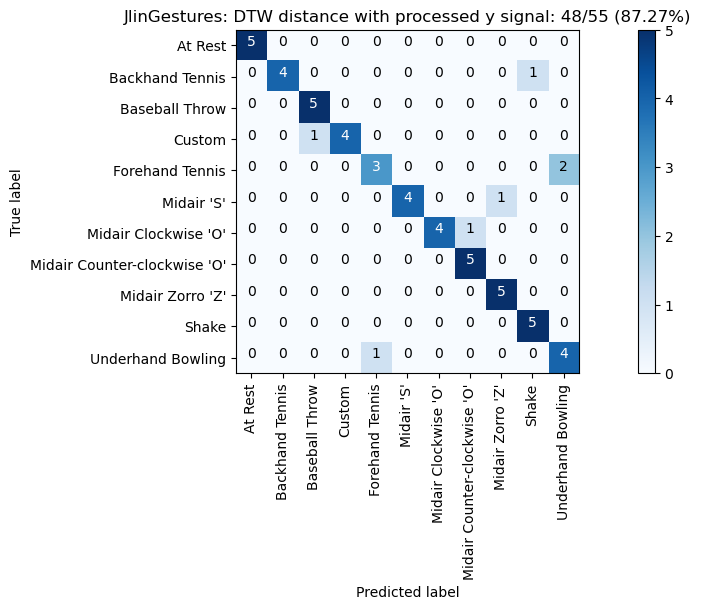

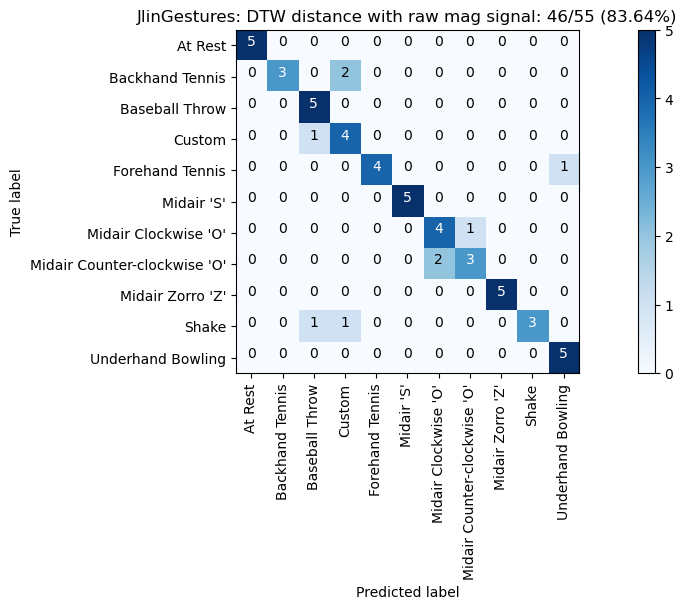

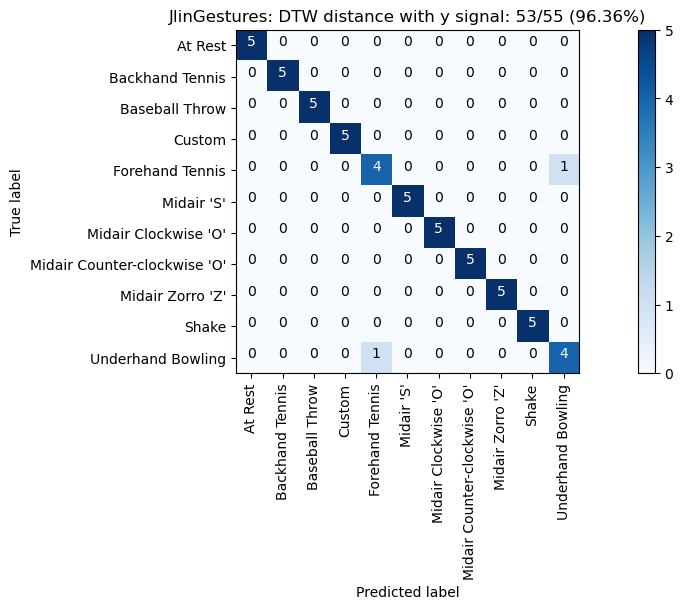

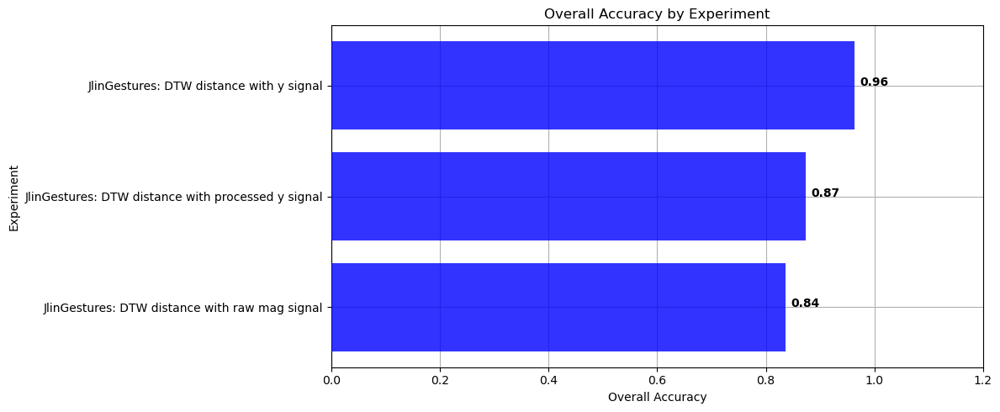

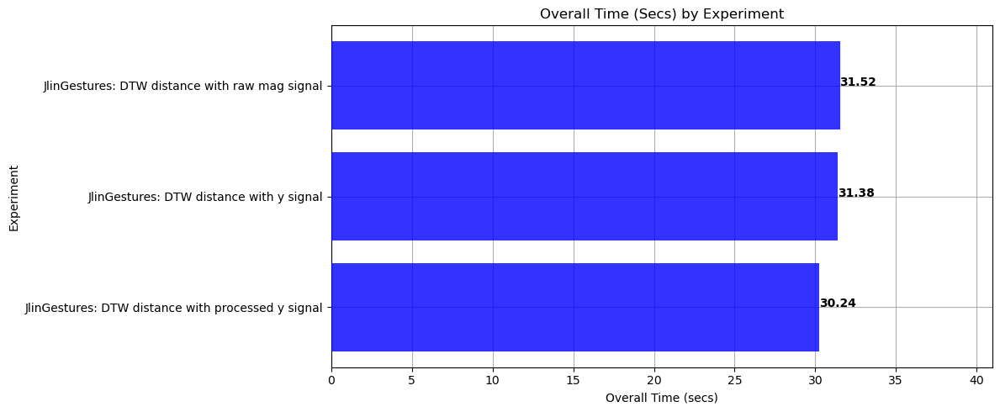

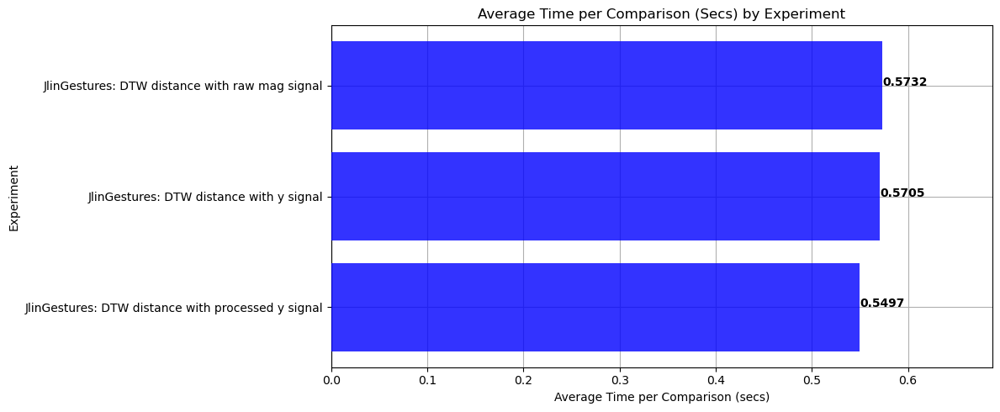

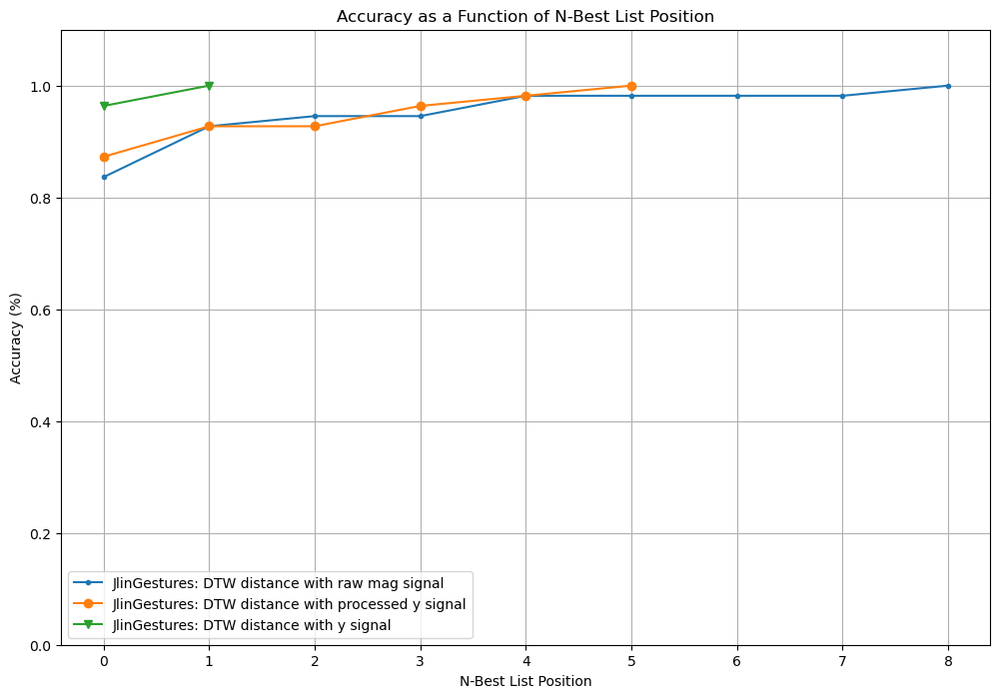

In [16]:
# plot_classification_result_as_confusion_matrix(results_y)
# plot_classification_result_as_confusion_matrix(results_shift_y_p)
# plot_classification_result_as_confusion_matrix(results_shift_mag)
# plot_classification_result_as_confusion_matrix(results_shift_y)
plot_classification_result_as_confusion_matrix(results_dtw_y_p)
plot_classification_result_as_confusion_matrix(results_dtw_mag)
plot_classification_result_as_confusion_matrix(results_dtw_y)
plot_bar_graph_overall_performance(experiments)
plot_bar_graph_overall_time(experiments)
plot_bar_graph_avg_time_per_comparison(experiments)
plot_nbestlist_performance(experiments)


# Comparing performance across gesture sets

Average accuracy: 0.9090909090909091 Stdev=0.05002950723183954


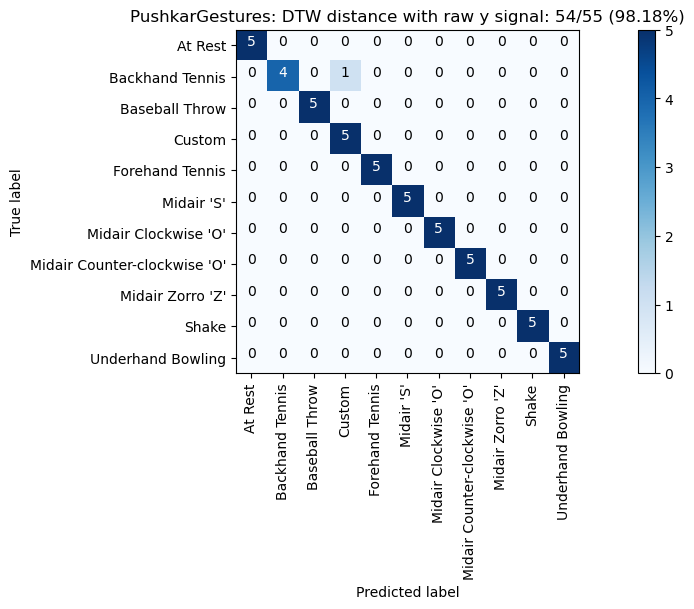

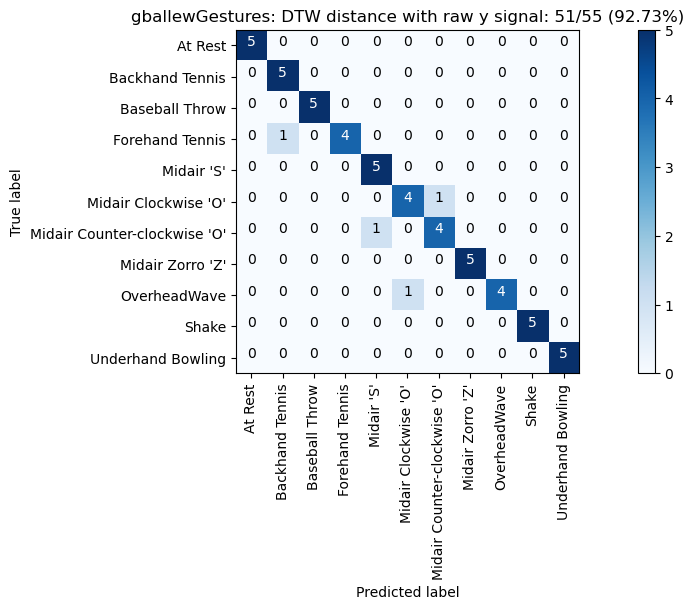

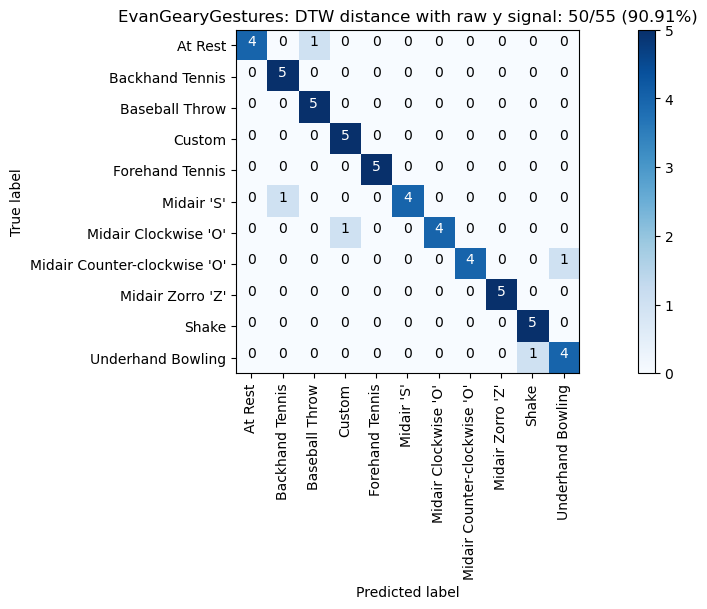

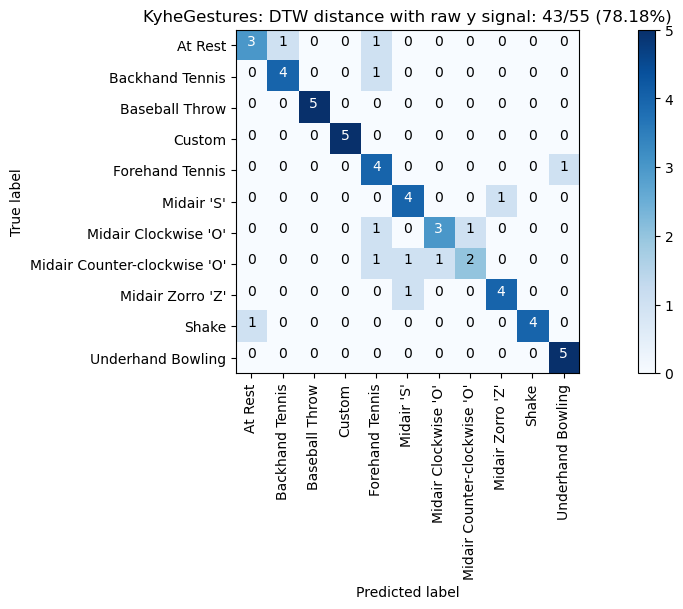

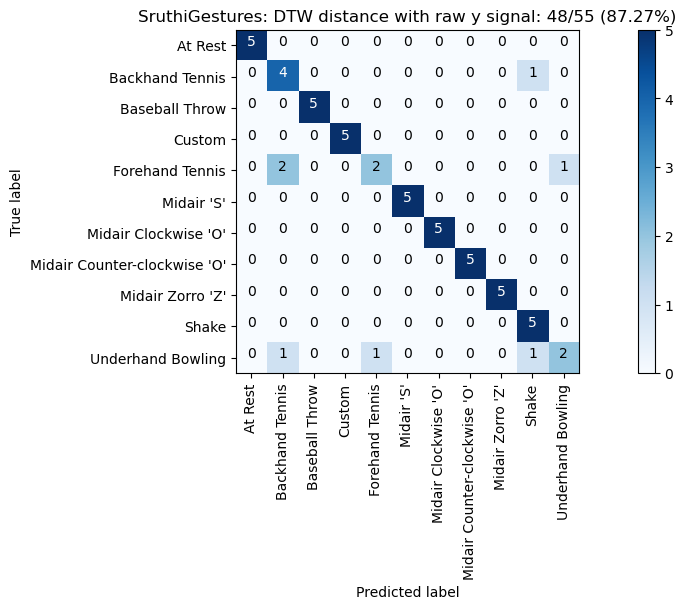

...

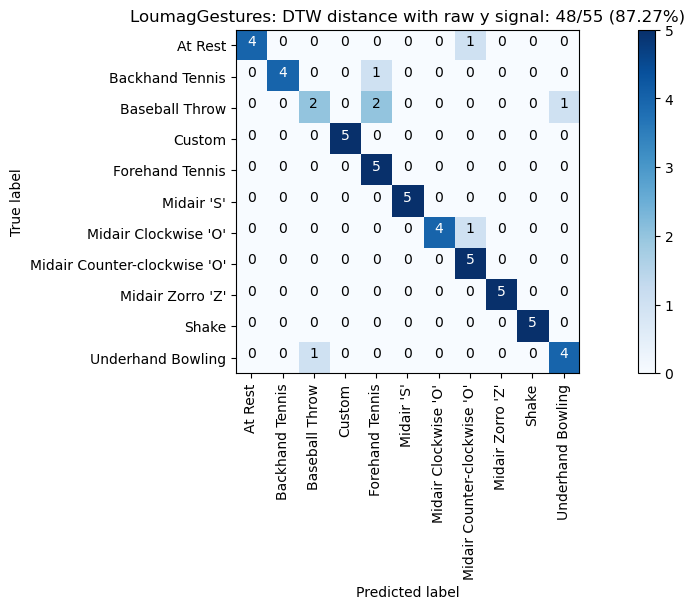

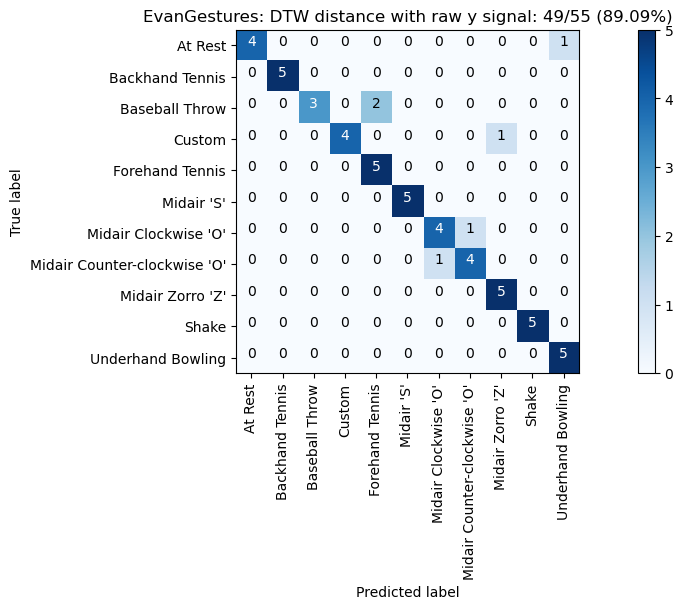

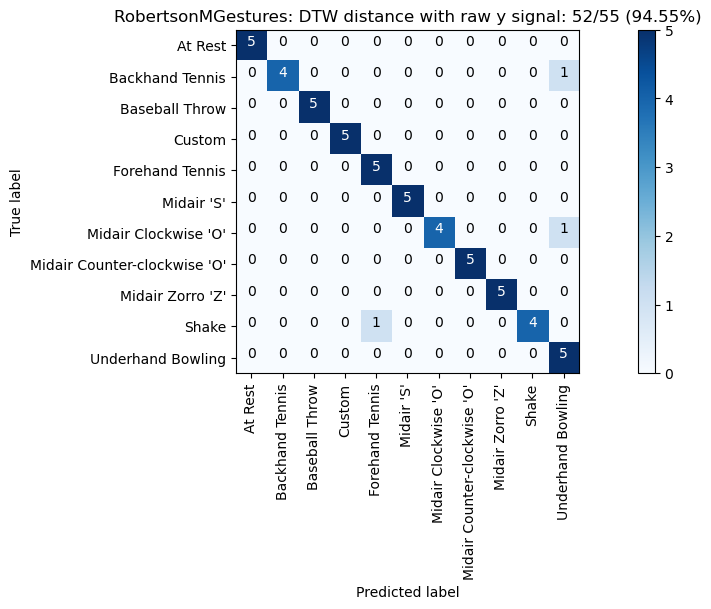

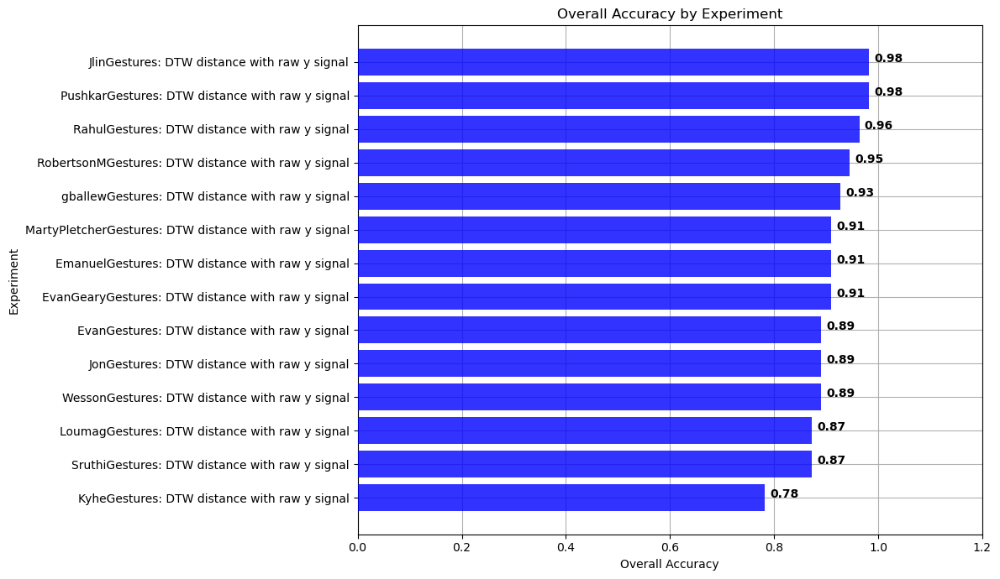

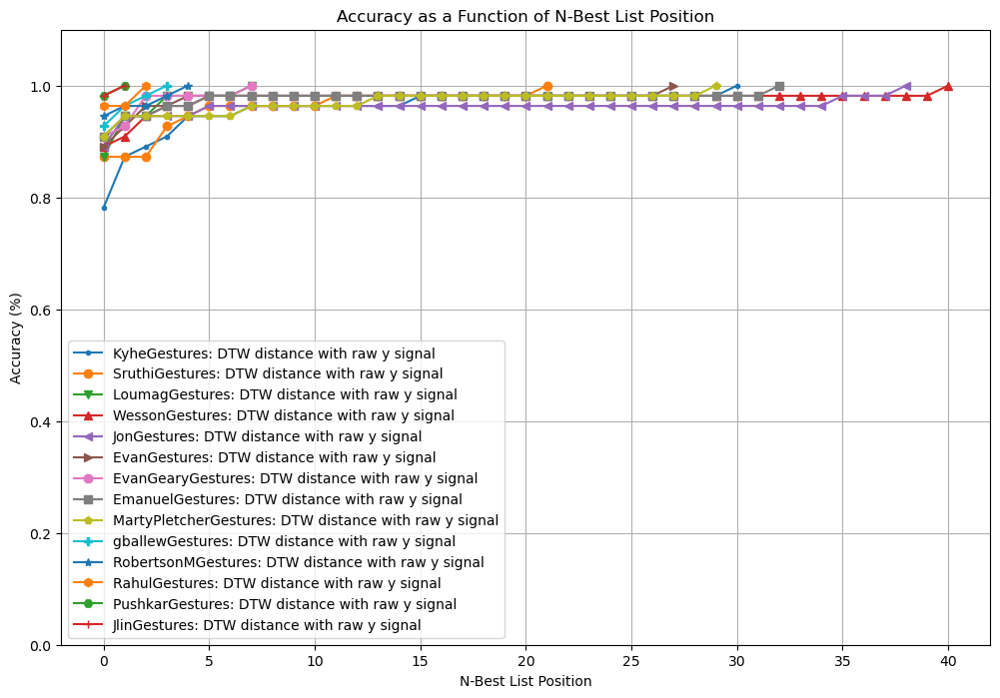

In [17]:
# track multiple experiments
experiments = Experiments()

# Run experiments across all gesture sets
for gesture_set_name, gesture_set in map_gesture_sets.items():
   
    list_folds = generate_kfolds_scikit(5, gesture_set, seed=5)
    
#     results_shift_y = run_matching_algorithm(list_folds, find_closest_match_shift_euclid, verbose=False, signal_var_name='y')
#     results_shift_y.title = "{}: Euclidean distance with cross-correlation-shifted y signal".format(gesture_set.name)
#     results_shift_y.print_result()
    
#     results_shift_mag = run_matching_algorithm(list_folds, find_closest_match_shift_euclid, verbose=False, signal_var_name='mag')
#     results_shift_mag.title = "{}: Euclidean distance with cross-correlation-shifted mag signal".format(gesture_set.name)
#     results_shift_mag.print_result()

    results_dtw_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='y')
    results_dtw_y.title = "{}: DTW distance with raw y signal".format(gesture_set.name)
#     results_dtw_y.print_result()
    
#     results_dtw_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='mag')
#     results_dtw_mag.title = "{}: DTW distance with raw mag signal".format(gesture_set.name)
#     results_dtw_mag.print_result()
    
#     plot_classification_result_as_confusion_matrix(results_shift_y)
#     plot_classification_result_as_confusion_matrix(results_shift_mag)
    plot_classification_result_as_confusion_matrix(results_dtw_y)
#     plot_classification_result_as_confusion_matrix(results_dtw_mag)
#     experiments.add(results_shift_y)
#     experiments.add(results_shift_mag)
    experiments.add(results_dtw_y)
#     experiments.add(results_dtw_mag)

avg_accuracy, stddev = experiments.get_avg_accuracy_with_std()
print(f"Average accuracy: {avg_accuracy} Stdev={stddev}")
plot_bar_graph_overall_performance(experiments)
plot_nbestlist_performance(experiments)

In [18]:
avg_accuracy, stddev = experiments.get_avg_accuracy_with_std()
print(f"Average accuracy: {avg_accuracy} Stdev={stddev}")

Average accuracy: 0.9090909090909091 Stdev=0.05002950723183954


# Sandbox
Everything below here is a Sandbox for you to play. You could do this in another Jupyter Notebook but I often have some cells at the bottom of my notebook that let's me experiment with and play with Python and the numpy, scipy, etc. libraries. I've added some example playground cells that I used when making the assignment.

Feel free to delete all of these cells but I thought they might be informative for you.

In [19]:
# Demonstration of numpy arithmetic array operations
import numpy as np
x = np.array([1,2,3])
y = np.array([1,2,3])
z = np.array([1,2,3])

sum1 = np.add(x, y, z)
print(sum1)

x = np.array([1,2,3])
y = np.array([1,2,3])
z = np.array([1,2,3])

sum2 = x + y + z
print(sum2)

[2 4 6]
[3 6 9]


In [20]:
# playing around with numpy subtraction. In order for these operations to work
# the arrays must be of the same size
np1 = np.array([1, 2, 3, 4, 5])
np2 = np.array([1, 2, 4, 5, 5])
np2 - np1

np3 = [1, 2, 3]

# the (0,2) value tells pad to pad 0 times in the front of array
# and three times to the end of array. See: https://docs.scipy.org/doc/numpy/reference/generated/numpy.pad.html
np3_resized = np.pad(np3, (0, 2), 'constant', constant_values=0)
np3_resized - np2

array([ 0,  0, -1, -5, -5])

In [21]:
# Testing to see if the numpy 'where' method supports string matching
a = np.array(['apple', 'orange', 'apple', 'banana'])

indicesWhereThereAreApples = np.where(a == 'apple')

print (indicesWhereThereAreApples)
print (a[indicesWhereThereAreApples])

(array([0, 2]),)
['apple' 'apple']


In [22]:
# Playing around with classes in Python 3. Notice how just like in Javascript, you can add a new member variable
# just by starting to use it!

class DummyClass:
    def __init__(self, variable):
        self.testVar = variable
        

dummy = DummyClass(5)
print(dummy.testVar)
dummy.newVar = 7 # added a new member variable called newVar here. Cool!
print(dummy.newVar)
vars(dummy) # prints out the member variables of the class

5
7


{'testVar': 5, 'newVar': 7}

In [23]:
# Experimenting with how unpacking tuples work
testTuple = (1,2,3,4,5,6,7,8,9,10)
print(testTuple)
print(*testTuple)
print(*testTuple[5:])

(1, 2, 3, 4, 5, 6, 7, 8, 9, 10)
1 2 3 4 5 6 7 8 9 10
6 7 8 9 10


In [24]:
# Experimenting with how we delete things out of lists
import random
testDict = {"a":1, "c":3, "d":4}
a = list(testDict.keys())
print(a)
random.shuffle(a)
print(a)
del a[1]
print(a)

['a', 'c', 'd']
['a', 'd', 'c']
['a', 'c']


In [25]:
# Playing around with how we can split up and combine lists in Python
testList = [1, 2, 3, 4, 5]
index = 4
print(testList[0:index] + testList[index + 1:5])

index = 3
print(testList[0:index] + testList[index + 1:5])

print(testList[index:])
print(testList[:index])

[1, 2, 3, 4]
[1, 2, 3, 5]
[4, 5]
[1, 2, 3]


In [26]:
# Find Euclidean distance between two numpy vector arrays
np1 = np.array([1, 2, 3, 4, 5])
np2 = np.array([5, 4, 3, 2, 1])

# First, we'll try numpy's way of determining Euclidean distance
# See: https://stackoverflow.com/a/1401828
npDist = np.linalg.norm(np2 - np1)
print(npDist)

# Next, we'll try scipy's way
# See: https://stackoverflow.com/a/21986532
from scipy.spatial import distance

scipyDist = distance.euclidean(np2,np1)
print(scipyDist)

6.324555320336759
6.324555320336759


[40.97363965 12.12702027 38.21863043  5.54503809 10.20773739  5.95476787
 43.89515356 26.18376448 24.60679993 36.59355501  0.72903755  4.66815168
 41.32771243 41.6746371  44.62055086 47.90067522 28.06685603  4.52743478
 49.79944565 23.870086   34.24578037 42.1687632  30.80624157 28.15937533
 18.40810962 34.54655987 40.80838399 46.28217443  0.28675283 36.02797866
 33.35295687  9.9882703  34.83324647 28.77068537 28.98606993  3.22534494
  8.86230648 17.0763543  30.43512917  9.7737478   6.07742333 46.73397544
 15.54899592 23.71582845  3.1105779  13.76720467 11.29941933 47.15267664
 18.86373186 19.19513077]


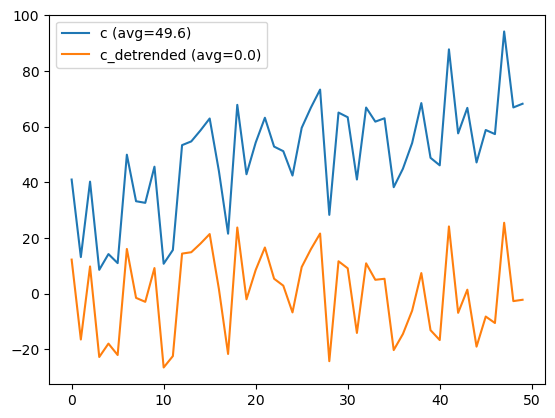

In [27]:
# detrend playground
from scipy import signal
a = np.random.rand(50) * 50
print(a)
b = np.array(range(0,50))
c = a + b

fig, axes = plt.subplots()
# axes.plot(a)
# axes.plot(b)
axes.plot(c, label="c (avg={:0.1f})".format(np.mean(c)))
c_detrended = signal.detrend(c)
axes.plot(c_detrended, label="c_detrended (avg={:0.1f})".format(np.mean(c_detrended)))
axes.legend()
